In [1]:
!pip install timm
!pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 50.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.5/268.5 kB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 53.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 42.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 48.6 MB/s eta 0:00:00


In [2]:

import os
import cv2
import gc
import numpy as np
import pandas as pd
import itertools
from tqdm.autonotebook import tqdm
import albumentations as A
import matplotlib.pyplot as plt

import torch
from torch import nn
import torch.nn.functional as F
import timm
from transformers import DistilBertModel, DistilBertConfig, DistilBertTokenizer
from sklearn.model_selection import train_test_split

<ipython-input-2-d296e71cb7ca>:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [3]:
!ls -lha kaggle.json
!pip install -q kaggle # installing the kaggle package
!mkdir -p ~/.kaggle # creating .kaggle folder where the key should be placed
!cp kaggle.json ~/.kaggle/ # move the key to the folder
!pwd # checking the present working directory
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets list

### For Flickr 8k
!kaggle datasets download -w joonrisse/hackathonriseoftransformers
! unzip hackathonriseoftransformers.zip

Streaming output truncated to the last 5000 lines.
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078711.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078712.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078713.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078714.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078715.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078716.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078717.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078718.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078719.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078720.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078721.jpg  
  inflating: r

In [4]:
df = pd.read_csv("/content/caption_prediction_train.csv", delimiter="\t")
df.head()

,ID,caption
0,ImageCLEFmedCaption_2022_train_000001,pericardial tamponade with clear distinction o...
1,ImageCLEFmedCaption_2022_train_000002,angiography of the aortic arch show delay visu...
2,ImageCLEFmedCaption_2022_train_000003,balloonocclude retrograde transvenous oblitera...
3,ImageCLEFmedCaption_2022_train_000004,film after glue embolization show no filling i...
4,ImageCLEFmedCaption_2022_train_000005,peripheral in posteroanterior projection angio...


In [5]:
class CFG:
    debug = False
    image_path = "/content/resized_train/resized_train"
    captions_path = "/content"
    batch_size = 32
    num_workers = 2
    head_lr = 1e-3
    image_encoder_lr = 1e-4
    text_encoder_lr = 1e-5
    weight_decay = 1e-3
    patience = 1
    factor = 0.8
    epochs = 4
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model_name = 'resnet50'
    image_embedding = 2048
    text_encoder_model = "distilbert-base-uncased"
    text_embedding = 768
    text_tokenizer = "distilbert-base-uncased"
    max_length = 200

    pretrained = True # for both image encoder and text encoder
    trainable = True # for both image encoder and text encoder
    temperature = 1.0

    # image size
    size = 224

    # for projection head; used for both image and text encoders
    num_projection_layers = 1
    projection_dim = 256
    dropout = 0.1

In [6]:
class CLIPDataset(torch.utils.data.Dataset):
    def __init__(self, image_filenames, captions, tokenizer, transforms):
        """
        image_filenames and cpations must have the same length; so, if there are
        multiple captions for each image, the image_filenames must have repetitive
        file names
        """

        self.image_filenames = image_filenames
        self.captions = list(captions)
        self.encoded_captions = tokenizer(
            list(captions), padding=True, truncation=True, max_length=CFG.max_length
        )
        self.transforms = transforms

    def __getitem__(self, idx):
        item = {
            key: torch.tensor(values[idx])
            for key, values in self.encoded_captions.items()
        }

        image = cv2.imread(f"{CFG.image_path}/{self.image_filenames[idx]}.jpg")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = self.transforms(image=image)['image']
        item['image'] = torch.tensor(image).permute(2, 0, 1).float()
        item['caption'] = self.captions[idx]

        return item


    def __len__(self):
        return len(self.captions)



def get_transforms(mode="train"):
    if mode == "train":
        return A.Compose(
            [
                A.Resize(CFG.size, CFG.size, always_apply=True),
                A.Normalize(max_pixel_value=255.0, always_apply=True),
            ]
        )
    else:
        return A.Compose(
            [
                A.Resize(CFG.size, CFG.size, always_apply=True),
                A.Normalize(max_pixel_value=255.0, always_apply=True),
            ]
        )

In [7]:
def make_train_valid_dfs():
    dataframe = pd.read_csv(f"{CFG.captions_path}/caption_prediction_train.csv", delimiter="\t")
    train_dataframe, valid_dataframe = train_test_split(dataframe, test_size=0.10, shuffle=True)
    return train_dataframe, valid_dataframe


def build_loaders(dataframe, tokenizer, mode):
    transforms = get_transforms(mode=mode)
    dataset = CLIPDataset(
        dataframe["ID"].values,
        dataframe["caption"].values,
        tokenizer=tokenizer,
        transforms=transforms,
    )
    dataloader = torch.utils.data.DataLoader(
        dataset,
        batch_size=CFG.batch_size,
        num_workers=CFG.num_workers,
        shuffle=True if mode == "train" else False,
    )
    return dataloader

In [8]:
class ImageEncoder(nn.Module):
    """
    Encode images to a fixed size vector
    """

    def __init__(
        self, model_name=CFG.model_name, pretrained=CFG.pretrained, trainable=CFG.trainable
    ):
        super().__init__()
        self.model = timm.create_model(
            model_name, pretrained, num_classes=0, global_pool="avg"
        )
        for p in self.model.parameters():
            p.requires_grad = trainable

    def forward(self, x):
        return self.model(x)

In [9]:
class TextEncoder(nn.Module):
    def __init__(self, model_name=CFG.text_encoder_model, pretrained=CFG.pretrained, trainable=CFG.trainable):
        super().__init__()
        if pretrained:
            self.model = DistilBertModel.from_pretrained(model_name)
        else:
            self.model = DistilBertModel(config=DistilBertConfig())

        for p in self.model.parameters():
            p.requires_grad = trainable

        # we are using the CLS token hidden representation as the sentence's embedding
        self.target_token_idx = 0

    def forward(self, input_ids, attention_mask):
        output = self.model(input_ids=input_ids, attention_mask=attention_mask)
        last_hidden_state = output.last_hidden_state
        return last_hidden_state[:, self.target_token_idx, :]

In [10]:
class ProjectionHead(nn.Module):
    def __init__(
        self,
        embedding_dim,
        projection_dim=CFG.projection_dim,
        dropout=CFG.dropout
    ):
        super().__init__()
        self.projection = nn.Linear(embedding_dim, projection_dim)
        self.gelu = nn.GELU()
        self.fc = nn.Linear(projection_dim, projection_dim)
        self.dropout = nn.Dropout(dropout)
        self.layer_norm = nn.LayerNorm(projection_dim)

    def forward(self, x):
        projected = self.projection(x)
        x = self.gelu(projected)
        x = self.fc(x)
        x = self.dropout(x)
        x = x + projected
        x = self.layer_norm(x)
        return x

In [11]:
class ClipLoss(nn.Module):
    def __init__(
            self,
    ):
        super().__init__()

    def get_ground_truth(self, device, num_logits) -> torch.Tensor:
        labels = torch.arange(num_logits, device=device, dtype=torch.long)
        return labels

    def get_logits(self, image_features, text_features, logit_scale):
        logits_per_image = logit_scale * image_features @ text_features.T
        logits_per_text = logit_scale * text_features @ image_features.T
        return logits_per_image, logits_per_text

    def forward(self, image_features, text_features, logit_scale, output_dict=False):
        device = image_features.device
        logits_per_image, logits_per_text = self.get_logits(image_features, text_features, logit_scale)
        labels = self.get_ground_truth(device, logits_per_image.shape[0])
        total_loss = (
            F.cross_entropy(logits_per_image, labels) +
            F.cross_entropy(logits_per_text, labels)
        ) / 2
        return total_loss

In [12]:
class CLIPModel(nn.Module):
    def __init__(
        self,
        temperature=CFG.temperature,
        image_embedding=CFG.image_embedding,
        text_embedding=CFG.text_embedding,
    ):
        super().__init__()
        self.image_encoder = ImageEncoder()
        self.text_encoder = TextEncoder()
        self.image_projection = ProjectionHead(embedding_dim=image_embedding)
        self.text_projection = ProjectionHead(embedding_dim=text_embedding)
        self.loss_fn = ClipLoss()
        self.temperature = temperature

    def forward(self, batch):
        # Getting Image and Text Features
        image_features = self.image_encoder(batch["image"])
        text_features = self.text_encoder(
            input_ids=batch["input_ids"], attention_mask=batch["attention_mask"]
        )
        # Getting Image and Text Embeddings (with same dimension)
        image_embeddings = self.image_projection(image_features)
        text_embeddings = self.text_projection(text_features)

        loss = self.loss_fn(image_embeddings, text_embeddings, 0.7)
        return loss


def cross_entropy(preds, targets, reduction='none'):
    log_softmax = nn.LogSoftmax(dim=-1)
    loss = (-targets * log_softmax(preds)).sum(1)
    if reduction == "none":
        return loss
    elif reduction == "mean":
        return loss.mean()

In [14]:
labels = pd.read_csv("/content/concepts.csv")
labels.head()

,concept,concept_name
0,C2825493,Non-Enhancing Lesion
1,C0922672,Right lateral rectus
2,C1167956,Cardiac Resynchronization Therapy
3,C0030288,Pancreatic duct
4,C0815700,Right obturator internus


In [15]:
text_descriptions = []
for index, row in labels.iterrows():
    label = row["concept_name"]
    text_descriptions.append(label)

In [16]:
text_descriptions

['Non-Enhancing Lesion',
 'Right lateral rectus',
 'Cardiac Resynchronization Therapy',
 'Pancreatic duct',
 'Right obturator internus',
 'Structure of occipital artery',
 'Femoral epiphysis',
 'Pancreatic Polypeptide',
 'Medial patellofemoral ligament',
 'Offset',
 'Empty delta sign',
 'Nonpenetrating Wounds',
 'Antibodies',
 'Right occipital lobe structure',
 'Clear Cell Meningioma',
 'Grade four rank',
 'Paravertebral region',
 'Subpleural honeycombing',
 'Pituitary Gland, Posterior',
 'cmH2O',
 'injured',
 'Grade two rank',
 'Circle of Willis',
 'Treatment Protocols',
 'Ewings sarcoma',
 'Irregular patellae',
 'Subcapsular sinus of lymph node',
 'Structure of intercondylar spine of tibia',
 'diclofenac epolamine',
 'Patella',
 'lithium',
 'Separate',
 'Red nucleus structure',
 'Right eye',
 'Skin marker',
 'Suprasternal short axis view',
 'AIDS related complex',
 'Prebone tissue',
 'Fascicular Pattern',
 'Structure of left gastroepiploic artery',
 'Patchy distribution',
 'Obstructi

In [17]:
train_df, valid_df = make_train_valid_dfs()
tokenizer = DistilBertTokenizer.from_pretrained(CFG.text_tokenizer)
train_loader = build_loaders(train_df, tokenizer, mode="train")
valid_loader = build_loaders(valid_df, tokenizer, mode="valid")

In [18]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [19]:
!cp "/content/drive/My Drive/CLIP_implementation_pytorch_from_scratch_on_ROCO_OriginalCLIPLossFunction.pt" "CLIP_implementation_pytorch_from_scratch_on_ROCO_OriginalCLIPLossFunction.pt"

In [20]:
def get_image_embeddings(valid_df, model_path):
    tokenizer = DistilBertTokenizer.from_pretrained(CFG.text_tokenizer)
    valid_loader = build_loaders(valid_df, tokenizer, mode="valid")

    model = CLIPModel().to(CFG.device)
    model.load_state_dict(torch.load(model_path, map_location=CFG.device))
    model.eval()

    valid_image_embeddings = []
    with torch.no_grad():
        for batch in tqdm(valid_loader):
            image_features = model.image_encoder(batch["image"].to(CFG.device))
            image_embeddings = model.image_projection(image_features)
            valid_image_embeddings.append(image_embeddings)
    return model, torch.cat(valid_image_embeddings)

In [21]:
_, image_embeddings = get_image_embeddings(valid_df, "/content/CLIP_implementation_pytorch_from_scratch_on_ROCO_OriginalCLIPLossFunction.pt")

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_transform.weight', 'vocab_transform.bias', 'vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


  0%|          | 0/261 [00:00<?, ?it/s]

In [22]:
def get_label_embeddings(text_descriptions, model_path):
    tokenizer = DistilBertTokenizer.from_pretrained(CFG.text_tokenizer)

    model = CLIPModel().to(CFG.device)
    model.load_state_dict(torch.load(model_path, map_location=CFG.device))
    model.eval()
    label_text_embeddings = []
    for label in text_descriptions:
        encoded_query = tokenizer([label])
        batch = {
            key: torch.tensor(values).to(CFG.device)
            for key, values in encoded_query.items()
        }
        with torch.no_grad():
            text_features = model.text_encoder(
            input_ids=batch["input_ids"], attention_mask=batch["attention_mask"]
          )
        text_embeddings = model.text_projection(text_features)
        label_text_embeddings.append(text_embeddings)
    return model, torch.cat(label_text_embeddings)

In [23]:
model, label_embeddings = get_label_embeddings(text_descriptions, "/content/CLIP_implementation_pytorch_from_scratch_on_ROCO_OriginalCLIPLossFunction.pt")

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_transform.weight', 'vocab_transform.bias', 'vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [25]:
image_embeddings_n = F.normalize(image_embeddings, p=2, dim=-1)
text_embeddings_n = F.normalize(label_embeddings, p=2, dim=-1)
dot_similarity = text_embeddings_n @ image_embeddings_n.T

In [26]:
text_probs = (100.0 * image_embeddings_n @ text_embeddings_n.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

In [27]:
image_filenames = valid_df['ID'].values

ValueError: ignored

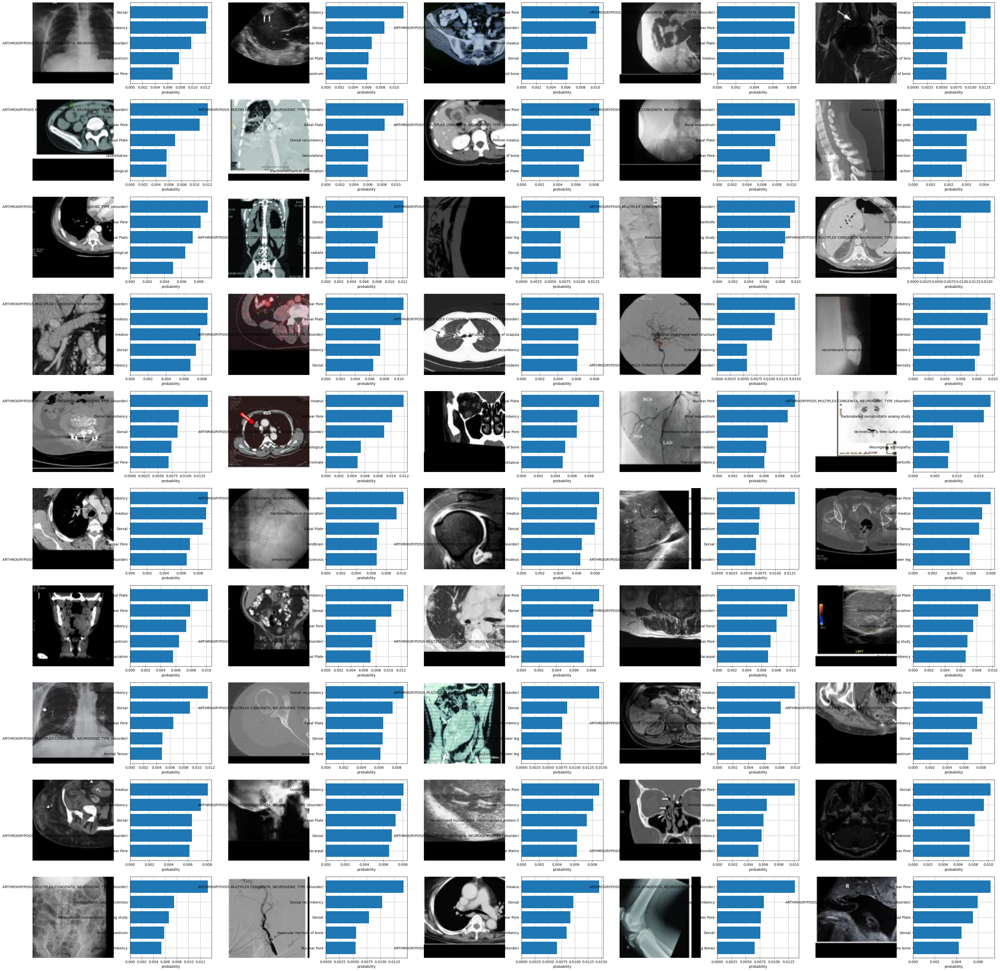

In [28]:
fig = plt.figure(figsize=(50, 50))  # Set the desired figure size
pre_element = "nothing"
counter = 0
for i, element in enumerate(image_filenames):
    if pre_element != element:
      pre_element = element
      image = cv2.imread(f"{CFG.image_path}/{element}.jpg")
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      plt.subplot(10, 10, 2 * counter + 1)
      plt.imshow(image)
      plt.axis("off")

      plt.subplot(10, 10, 2 * counter + 2)
      y = np.arange(top_probs.shape[-1])
      plt.grid()
      plt.barh(y, top_probs[i].detach().numpy())
      plt.gca().invert_yaxis()
      plt.gca().set_axisbelow(True)
      plt.yticks(y, [text_descriptions[index] for index in top_labels[i].numpy()])
      plt.xlabel("probability")
      counter += 1
    else:
      continue

plt.subplots_adjust(wspace=0.5)
plt.show()

In [29]:
import warnings
warnings.filterwarnings('ignore')

In [30]:
# Create an empty dataframe
df_zero_shot = pd.DataFrame(columns=['Image_name', 'Label'])

# Loop through your data and add values to the dataframe
for i, element in enumerate(image_filenames):
    # Assuming 'your_data' is a list of tuples where each tuple contains image_name and labels

    # Split the labels if they are separated by a delimiter like ';'
    labels_list = [text_descriptions[index] for index in top_labels[i].numpy()]

    # Create a new row for each label
    for label in labels_list:
        # Append a new row to the dataframe
        df_zero_shot = df_zero_shot.append({'Image_name': element, 'Label': label}, ignore_index=True)

In [32]:
df_zero_shot.head(10)

,Image_name,Label
0,ImageCLEFmedCaption_2022_train_007610,Dorsal
1,ImageCLEFmedCaption_2022_train_007610,Dorsal recumbency
2,ImageCLEFmedCaption_2022_train_007610,"ARTHROGRYPOSIS MULTIPLEX CONGENITA, NEUROGENIC..."
3,ImageCLEFmedCaption_2022_train_007610,Bone sequestrum
4,ImageCLEFmedCaption_2022_train_007610,Nuclear Pore
5,ImageCLEFmedCaption_2022_train_028658,Dorsal recumbency
6,ImageCLEFmedCaption_2022_train_028658,Dorsal
7,ImageCLEFmedCaption_2022_train_028658,Nuclear Pore
8,ImageCLEFmedCaption_2022_train_028658,Basal Plate
9,ImageCLEFmedCaption_2022_train_028658,Bone sequestrum


## Zero Shot Learning on 10 most frequent concept in the dataseet

In [70]:
concepts = pd.read_csv("/content/concepts.csv")
concepts.head()

,concept,concept_name
0,C2825493,Non-Enhancing Lesion
1,C0922672,Right lateral rectus
2,C1167956,Cardiac Resynchronization Therapy
3,C0030288,Pancreatic duct
4,C0815700,Right obturator internus


In [71]:
labels = pd.read_csv("/content/concept_detection_train.csv", delimiter="\t")
labels.head()

,ID,cuis
0,ImageCLEFmedCaption_2022_train_000001,C0002978;C0007177;C0031050
1,ImageCLEFmedCaption_2022_train_000002,C0002978;C0003489;C0175631;C0443127;C0226261
2,ImageCLEFmedCaption_2022_train_000003,C0002978;C0021102;C0085590;C0232180;C0205197;C...
3,ImageCLEFmedCaption_2022_train_000004,C0002978;C0013931;C0178866;C1510412
4,ImageCLEFmedCaption_2022_train_000005,C0002978;C0205100;C0226463


In [72]:
# Split the labels into separate columns
labels['labels'] = labels['cuis'].str.split(';')
labels = labels.explode('labels')

In [73]:
labels.head()

,ID,cuis,labels
0,ImageCLEFmedCaption_2022_train_000001,C0002978;C0007177;C0031050,C0002978
0,ImageCLEFmedCaption_2022_train_000001,C0002978;C0007177;C0031050,C0007177
0,ImageCLEFmedCaption_2022_train_000001,C0002978;C0007177;C0031050,C0031050
1,ImageCLEFmedCaption_2022_train_000002,C0002978;C0003489;C0175631;C0443127;C0226261,C0002978
1,ImageCLEFmedCaption_2022_train_000002,C0002978;C0003489;C0175631;C0443127;C0226261,C0003489


In [74]:
merged_df = pd.merge(labels, concepts, left_on='labels', right_on='concept', how='inner')
merged_df = merged_df.drop(columns=['cuis', 'labels'])
merged_df.head()

,ID,concept,concept_name
0,ImageCLEFmedCaption_2022_train_000001,C0002978,angiogram
1,ImageCLEFmedCaption_2022_train_000002,C0002978,angiogram
2,ImageCLEFmedCaption_2022_train_000003,C0002978,angiogram
3,ImageCLEFmedCaption_2022_train_000004,C0002978,angiogram
4,ImageCLEFmedCaption_2022_train_000005,C0002978,angiogram


In [90]:
valid_df.head()

,ID,caption
7568,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia
28467,ImageCLEFmedCaption_2022_train_028658,transthoracic echocardiography show severely d...
47245,ImageCLEFmedCaption_2022_train_047527,preoperative ct abdomen pelvi image show norma...
55557,ImageCLEFmedCaption_2022_train_055887,small bowel series demonstrate a large jejunal...
34897,ImageCLEFmedCaption_2022_train_035120,severe adverse reaction to metal debris corona...


In [91]:
valid_merged_df = pd.merge(valid_df, merged_df, left_on='ID', right_on='ID', how='inner')
valid_merged_df.head()

,ID,caption,concept,concept_name
0,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C0817096,Chest
1,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C0011813,Dextrocardia
2,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C1306645,Plain x-ray
3,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C0024867,Mass Chest X-Ray
4,ImageCLEFmedCaption_2022_train_028658,transthoracic echocardiography show severely d...,C0225897,Left ventricular structure


In [92]:
value_counts = valid_merged_df['concept'].value_counts()

most_frequent_value = value_counts.idxmax()

# Get the 10 most frequent values
top_10_frequent_values = value_counts.head(10)

# Print the 10 most frequent values
print(top_10_frequent_values)

C0040405    2632
C1306645    2424
C0024485    1428
C0041618    1119
C0817096     808
C0002978     616
C0000726     565
C0037303     506
C0221198     391
C0205131     348
Name: concept, dtype: int64


In [100]:
df_top_10 = pd.DataFrame({'Label': top_10_frequent_values.index, 'Count': top_10_frequent_values.values})
df_top_10.head()

,Label,Count
0,C0040405,2632
1,C1306645,2424
2,C0024485,1428
3,C0041618,1119
4,C0817096,808


In [101]:
df_top_10 = pd.merge(df_top_10, concepts, left_on='Label', right_on='concept', how='inner')
df_top_10 = df_top_10.drop(columns=['Count', 'concept'])
df_top_10.head(10)

,Label,concept_name
0,C0040405,X-Ray Computed Tomography
1,C1306645,Plain x-ray
2,C0024485,Magnetic Resonance Imaging
3,C0041618,Ultrasonography
4,C0817096,Chest
5,C0002978,angiogram
6,C0000726,Abdomen
7,C0037303,Bone structure of cranium
8,C0221198,Lesion
9,C0205131,Axial


In [105]:
text_descriptions = []
for index, row in df_top_10.iterrows():
    label = row["concept_name"]
    text_descriptions.append(label)

In [106]:
model, label_embeddings = get_label_embeddings(text_descriptions, "/content/CLIP_implementation_pytorch_from_scratch_on_ROCO_OriginalCLIPLossFunction.pt")

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_transform.weight', 'vocab_transform.bias', 'vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [107]:
image_embeddings_n = F.normalize(image_embeddings, p=2, dim=-1)
text_embeddings_n = F.normalize(label_embeddings, p=2, dim=-1)
dot_similarity = text_embeddings_n @ image_embeddings_n.T

In [108]:
text_probs = (100.0 * image_embeddings_n @ text_embeddings_n.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

ValueError: ignored

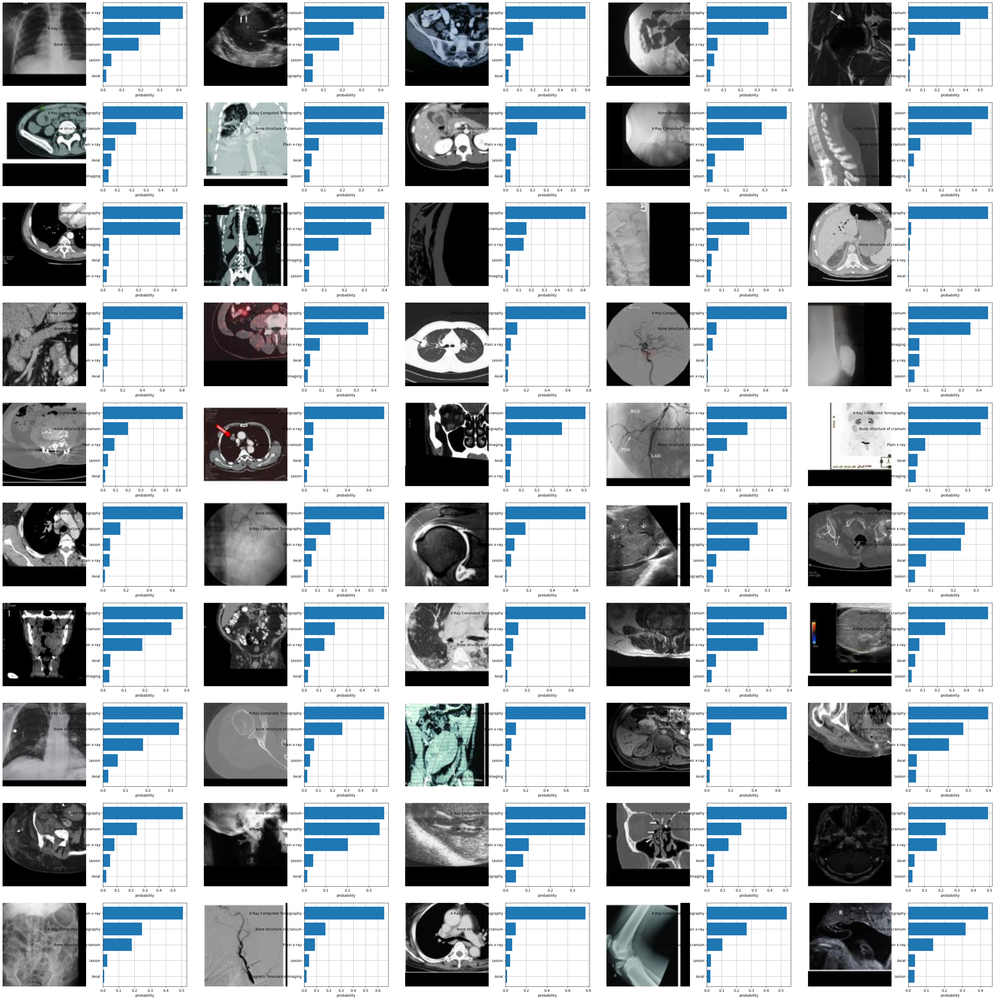

In [109]:
fig = plt.figure(figsize=(50, 50))  # Set the desired figure size
pre_element = "nothing"
counter = 0
for i, element in enumerate(image_filenames):
    if pre_element != element:
      pre_element = element
      image = cv2.imread(f"{CFG.image_path}/{element}.jpg")
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      plt.subplot(10, 10, 2 * counter + 1)
      plt.imshow(image)
      plt.axis("off")

      plt.subplot(10, 10, 2 * counter + 2)
      y = np.arange(top_probs.shape[-1])
      plt.grid()
      plt.barh(y, top_probs[i].detach().numpy())
      plt.gca().invert_yaxis()
      plt.gca().set_axisbelow(True)
      plt.yticks(y, [text_descriptions[index] for index in top_labels[i].numpy()])
      plt.xlabel("probability")
      counter += 1
    else:
      continue

plt.subplots_adjust(wspace=0.5)
plt.show()

In [112]:
# Create an empty dataframe
df_zero_shot_top10 = pd.DataFrame(columns=['ID', 'Predicted_Label'])

# Loop through your data and add values to the dataframe
for i, element in enumerate(image_filenames):
    # Assuming 'your_data' is a list of tuples where each tuple contains image_name and labels

    # Split the labels if they are separated by a delimiter like ';'
    labels_list = [text_descriptions[index] for index in top_labels[i].numpy()]

    # Create a new row for each label
    for label in labels_list:
        # Append a new row to the dataframe
        df_zero_shot_top10 = df_zero_shot_top10.append({'ID': element, 'Predicted_Label': label}, ignore_index=True)

In [113]:
df_zero_shot_top10.head()

,ID,Predicted_Label
0,ImageCLEFmedCaption_2022_train_007610,Plain x-ray
1,ImageCLEFmedCaption_2022_train_007610,X-Ray Computed Tomography
2,ImageCLEFmedCaption_2022_train_007610,Bone structure of cranium
3,ImageCLEFmedCaption_2022_train_007610,Lesion
4,ImageCLEFmedCaption_2022_train_007610,Axial


In [136]:
top_10_labels = df_top_10['Label'].tolist()
valid_merged_df = valid_merged_df[valid_merged_df['concept'].isin(top_10_labels)]

In [137]:
len(valid_merged_df['ID'].unique()) # So we can see that most images in the dataframe have at least one of the frequent labels

8242

In [138]:
merged_df_true_vs_predicted = pd.merge(valid_merged_df, df_zero_shot_top10, on='ID', how='inner')
merged_df_true_vs_predicted.head(30)

,ID,caption,concept,concept_name,Predicted_Label
0,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C0817096,Chest,Plain x-ray
1,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C0817096,Chest,X-Ray Computed Tomography
2,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C0817096,Chest,Bone structure of cranium
3,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C0817096,Chest,Lesion
4,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C0817096,Chest,Axial
5,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C1306645,Plain x-ray,Plain x-ray
6,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C1306645,Plain x-ray,X-Ray Computed Tomography
7,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C1306645,Plain x-ray,Bone structure of cranium
8,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C1306645,Plain x-ray,Lesion
9,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C1306645,Plain x-ray,Axial


In [139]:
len(image_filenames)

8328

In [140]:
relevant_df_true_vs_predicted = merged_df_true_vs_predicted[merged_df_true_vs_predicted['concept_name'] == merged_df_true_vs_predicted['Predicted_Label']]
relevant_df_true_vs_predicted.head()

,ID,caption,concept,concept_name,Predicted_Label
5,ImageCLEFmedCaption_2022_train_007610,xray chest pa view show dextrocardia,C1306645,Plain x-ray,Plain x-ray
14,ImageCLEFmedCaption_2022_train_028658,transthoracic echocardiography show severely d...,C0041618,Ultrasonography,Ultrasonography
20,ImageCLEFmedCaption_2022_train_047527,preoperative ct abdomen pelvi image show norma...,C0040405,X-Ray Computed Tomography,X-Ray Computed Tomography
25,ImageCLEFmedCaption_2022_train_055887,small bowel series demonstrate a large jejunal...,C0040405,X-Ray Computed Tomography,X-Ray Computed Tomography
34,ImageCLEFmedCaption_2022_train_035120,severe adverse reaction to metal debris corona...,C0024485,Magnetic Resonance Imaging,Magnetic Resonance Imaging


In [141]:
for index, row in merged_df_true_vs_predicted.iterrows():
    if row['ID'] in relevant_df_true_vs_predicted['ID'].values:
       continue
    else:
      new_row = pd.Series({'ID': row['ID'], 'caption': row['caption'], 'concept': row['concept'], 'concept_name': row['concept_name'], 'Predicted_Label': row['Predicted_Label']})
      # Add the row to the dataframe
      relevant_df_true_vs_predicted = relevant_df_true_vs_predicted.append(new_row, ignore_index=True)

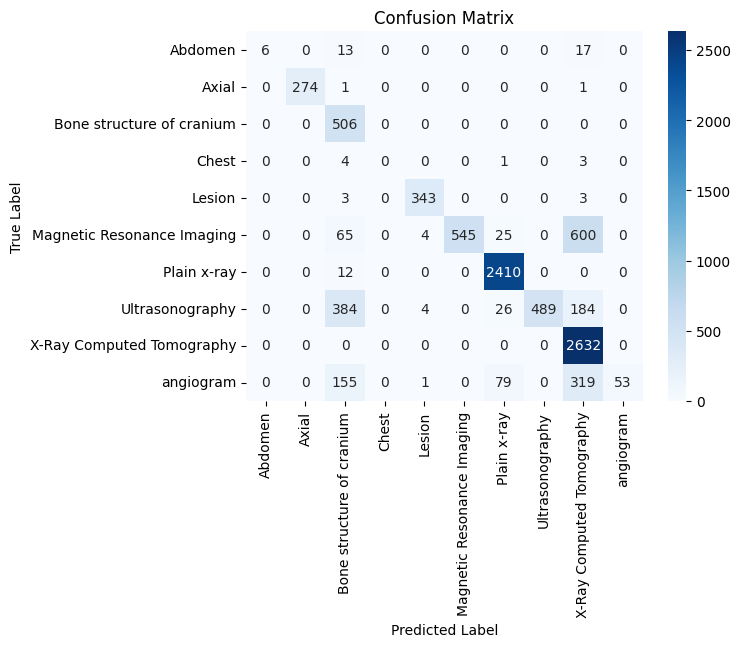

In [150]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Get the unique labels from the dataframe
labels = sorted(relevant_df_true_vs_predicted['concept_name'].unique())

# Get the true labels and predicted labels from the dataframe
true_labels = relevant_df_true_vs_predicted['concept_name']
predicted_labels = relevant_df_true_vs_predicted['Predicted_Label']

# Create a mapping from labels to numerical indices
label_to_index = {label: i for i, label in enumerate(labels)}

# Convert true labels and predicted labels to numerical indices
true_indices = true_labels.map(label_to_index)
predicted_indices = predicted_labels.map(label_to_index)

# Compute the confusion matrix
cm = confusion_matrix(true_indices, predicted_indices)

# Create a dataframe from the confusion matrix
cm_df = pd.DataFrame(cm, index=labels, columns=labels)

# Create a heatmap of the confusion matrix using seaborn
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')

# Add labels, title, and axis ticks
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')

# Show the plot
plt.show()
